<div style="text-align: center;">
  <h1 style="font-size: 35px; font-family: 'Calisto MT', serif; letter-spacing: 0.1em; background-color: rgb(25, 55, 109); margin: 0; color: white; padding: 10px;">
    Statistiques exploratoires spatiales (avec Python)
  </h1>
  <h3 style="font-size: 25px; font-family: 'Calisto MT', serif; letter-spacing: 0.1em; background-color: rgb(42, 108, 56); margin: 0; color: white; padding: 8px;">
    TP3 : Réalisé par le Groupe 1
  </h3>
  <p style="text-align: center; font-family: 'Calisto MT', serif; margin-top: 10px;">ENSAE 2025 : ISE1 CL</p>
</div>

# <span style="font-weight:600; color:#1a5fb4;">ÉTAPE 0 : Préparation de l’environnement</span>

## <span style="font-weight: 600; color: #2d5e8a;">1. Chargement des librairies et paramètres généraux</span>

In [4]:

from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import rasterio
from rasterio.plot import show
import rasterio.mask

import plotly.express as px
import folium
from folium.features import GeoJsonTooltip

from io import BytesIO
import base64



DATA_DIR = Path(r"C:/Users/HP/Desktop/ISE1 CL/Semestre1/Statistiques Exploratoires Spatiales/TP/TP_Groupe/TP3/data")
OUTPUT_DIR = Path(r"C:/Users/HP/Desktop/ISE1 CL/Semestre1/Statistiques Exploratoires Spatiales/TP/TP_Groupe/TP3/outputs")

CRS_WGS84 = "EPSG:4326"    # coord. géographiques
CRS_UTM = "EPSG:32631"  # UTM zone 31N, adapté au Bénin pour les distances

## <span style="font-weight: 600; color: #2d5e8a;">2. Fonctions utilitaires de base</span>

In [5]:

def load_vector(path, crs=CRS_WGS84):
    """
    Charge un fichier vectoriel (shp/geojson/gpkg) et le reprojette en CRS_WGS84.
    """
    gdf = gpd.read_file(path)
    if crs is not None:
        gdf = gdf.to_crs(crs)
    return gdf


def quick_info_gdf(name, gdf):
    """
    Affiche quelques infos utiles sur un GeoDataFrame.
    """
    print(f"\n--- {name} ---")
    print(f"Nombre d'entités : {len(gdf)}")
    print(f"CRS              : {gdf.crs}")
    print(f"Colonnes         : {list(gdf.columns)}")


def plot_base_map(pays_gdf, departement_gdf, ax=None, title=None):
    """
    Carte de base simple du Bénin + départements.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 8))
    else:
        fig = ax.figure

    pays_gdf.boundary.plot(ax=ax, linewidth=1, edgecolor="black")
    departement_gdf.boundary.plot(ax=ax, linewidth=0.5, edgecolor="grey")

    ax.set_axis_off()
    if title:
        ax.set_title(title, fontsize=14, fontweight="bold", pad=10)

    return fig, ax


## <span style="font-weight: 600; color: #2d5e8a;">3. Chargement des données</span>

In [155]:
pays = gpd.read_file(DATA_DIR / "geoBoundaries-BEN-ADM0.geojson")
departement = gpd.read_file(DATA_DIR / "geoBoundaries-BEN-ADM1.geojson")

roads = healthsites = gpd.read_file(DATA_DIR / "gis_osm_roads_free_1.shp")
protected_areas = healthsites = gpd.read_file(DATA_DIR / "protected_areas.shp")
healthsites = gpd.read_file(DATA_DIR / "benin-healthsites.shp")        
education_facilities = gpd.read_file(DATA_DIR / "hotosm_ben_education_facilities_points_geojson.geojson")
places = gpd.read_file(DATA_DIR / "gis_osm_places_a_free_1.shp") 
railways = gpd.read_file(DATA_DIR / "hotosm_ben_railways_lines_geojson.geojson")

In [7]:
healthsites['amenity'].unique()

array(['clinic', 'pharmacy', 'doctors', 'dentist', 'hospital',
       'social_facility', None], dtype=object)

In [8]:
hospitals = healthsites[healthsites['amenity'] == 'hospital'].copy()
pharmacies = healthsites[healthsites['amenity'] == 'pharmacy'].copy()

In [9]:
education_facilities['amenity'].unique()

array(['school', 'kindergarten', 'college', 'university', None],
      dtype=object)

In [10]:
schools = education_facilities[education_facilities['amenity'] == 'school'].copy()

In [11]:
print(sorted(places['fclass'].dropna().unique()))

['farm', 'hamlet', 'island', 'town', 'village']


In [12]:
village = places[places['fclass'] == 'village'].copy()
hamlet = places[places['fclass'] == 'hamlet'].copy()
island = places[places['fclass'] == 'island'].copy()
town = places[places['fclass'] == 'town'].copy()
farm = places[places['fclass'] == 'farm'].copy()

In [13]:
roads['fclass'].unique()

array(['trunk', 'primary', 'unclassified', 'tertiary', 'residential',
       'primary_link', 'secondary', 'secondary_link', 'service',
       'footway', 'path', 'track_grade5', 'track', 'track_grade3',
       'track_grade4', 'track_grade2', 'unknown', 'pedestrian',
       'trunk_link', 'living_street', 'tertiary_link', 'cycleway',
       'bridleway', 'track_grade1', 'steps'], dtype=object)

In [14]:
main_road_types = ['trunk', 'primary', 'secondary']
main_roads = roads[roads['fclass'].isin(main_road_types)].copy()

## <span style="font-weight: 600; color: #2d5e8a;">4. Visualisation des infrastructures</span>

In [15]:
hospitals.columns

Index(['osm_id', 'osm_type', 'completene', 'amenity', 'healthcare', 'name',
       'operator', 'source', 'speciality', 'operator_t', 'operationa',
       'opening_ho', 'beds', 'staff_doct', 'staff_nurs', 'health_ame',
       'dispensing', 'wheelchair', 'emergency', 'insurance', 'water_sour',
       'electricit', 'is_in_heal', 'is_in_he_1', 'url', 'addr_house',
       'addr_stree', 'addr_postc', 'addr_city', 'changeset_', 'changese_1',
       'changese_2', 'uuid', 'geometry'],
      dtype='object')

In [232]:

DEPT_COL = "shapeName"

hospitals_wgs84 = hospitals.to_crs("EPSG:4326").copy()
departement_wgs84 = departement.to_crs("EPSG:4326").copy()

hospitals_with_dept = gpd.sjoin(
    hospitals_wgs84,
    departement_wgs84[[DEPT_COL, 'geometry']],
    how='left',
    predicate='within'
)
hospitals_with_dept[DEPT_COL] = hospitals_with_dept[DEPT_COL].fillna("Hors département")
hospitals_with_dept['longitude'] = hospitals_with_dept.geometry.x
hospitals_with_dept['latitude'] = hospitals_with_dept.geometry.y
hospitals_with_dept['name'] = hospitals_with_dept['name'].fillna("Hôpital non nommé")

hospitals_clean = hospitals_with_dept[['name', DEPT_COL, 'longitude', 'latitude', 'geometry']].copy()

pharmacies_wgs84 = pharmacies.to_crs("EPSG:4326").copy()

pharmacies_with_dept = gpd.sjoin(
    pharmacies_wgs84,
    departement_wgs84[[DEPT_COL, 'geometry']],
    how='left',
    predicate='within'
)
pharmacies_with_dept[DEPT_COL] = pharmacies_with_dept[DEPT_COL].fillna("Hors département")
pharmacies_with_dept['longitude'] = pharmacies_with_dept.geometry.x
pharmacies_with_dept['latitude'] = pharmacies_with_dept.geometry.y
pharmacies_with_dept['name'] = pharmacies_with_dept['name'].fillna("Pharmacie non nommée")

pharmacies_clean = pharmacies_with_dept[['name', DEPT_COL, 'longitude', 'latitude', 'geometry']].copy()


all_points = pd.concat([hospitals_clean, pharmacies_clean])
center_lat = all_points.geometry.y.mean()
center_lon = all_points.geometry.x.mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=7, tiles="CartoDB positron")

tooltip_hosp = GeoJsonTooltip(
    fields=['name', DEPT_COL, 'longitude', 'latitude'],
    aliases=["Nom :", "Département :", "Longitude :", "Latitude :"],
    localize=True,
    sticky=False,
    labels=True,
    style="background-color: white; border: 1px solid #333; border-radius: 4px; padding: 5px; font-family: Arial, sans-serif;"
)

folium.GeoJson(
    hospitals_clean.__geo_interface__,
    name="Hôpitaux",
    tooltip=tooltip_hosp,
    marker=folium.CircleMarker(
        radius=6,
        fill=True,
        fill_color='#FF3366',  # rouge
        color='#FF3366',
        fill_opacity=0.8
    )
).add_to(m)


tooltip_pharm = GeoJsonTooltip(
    fields=['name', DEPT_COL, 'longitude', 'latitude'],
    aliases=["Nom :", "Département :", "Longitude :", "Latitude :"],
    localize=True,
    sticky=False,
    labels=True,
    style="background-color: white; border: 1px solid #333; border-radius: 4px; padding: 5px; font-family: Arial, sans-serif;"
)

folium.GeoJson(
    pharmacies_clean.__geo_interface__,
    name="Pharmacies",
    tooltip=tooltip_pharm,
    marker=folium.CircleMarker(
        radius=6,
        fill=True,
        fill_color='#3366FF',  # bleu
        color='#3366FF',
        fill_opacity=0.8
    )
).add_to(m)


folium.LayerControl().add_to(m)

output_path = OUTPUT_DIR / "hopitals_et_pharmacies_map.html"
m.save(str(output_path))


m

In [17]:
hospitals_with_dept.columns

Index(['osm_id', 'osm_type', 'completene', 'amenity', 'healthcare', 'name',
       'operator', 'source', 'speciality', 'operator_t', 'operationa',
       'opening_ho', 'beds', 'staff_doct', 'staff_nurs', 'health_ame',
       'dispensing', 'wheelchair', 'emergency', 'insurance', 'water_sour',
       'electricit', 'is_in_heal', 'is_in_he_1', 'url', 'addr_house',
       'addr_stree', 'addr_postc', 'addr_city', 'changeset_', 'changese_1',
       'changese_2', 'uuid', 'geometry', 'index_right', 'shapeName',
       'longitude', 'latitude'],
      dtype='object')

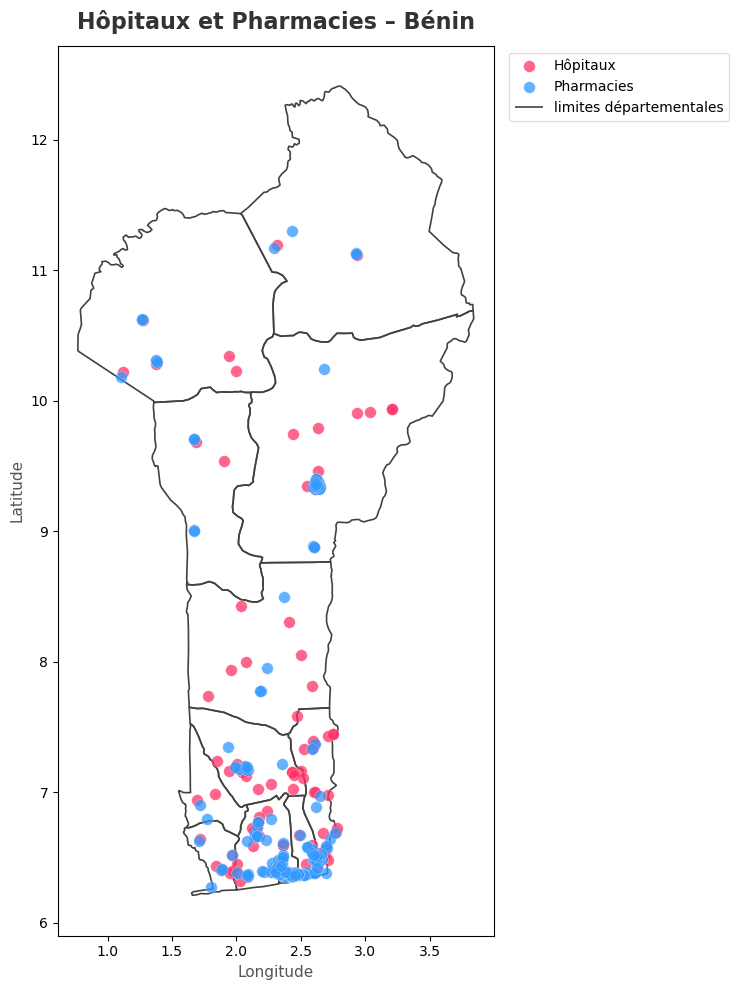

In [231]:

fig, ax = plt.subplots(figsize=(13, 10))

if not hospitals.empty:
    hospitals.to_crs(pays.crs).plot(
        ax=ax,
        color='#FF3366',
        marker='o',
        markersize=70,
        alpha=0.75,
        edgecolor='white',
        linewidth=0.2,
        zorder=3,
        label='Hôpitaux'
    )


if not pharmacies.empty:
    pharmacies.to_crs(pays.crs).plot(
        ax=ax,
        color='#3399FF',
        marker='o',
        markersize=70,
        alpha=0.75,
        edgecolor='white',
        linewidth=0.2,
        zorder=3,
        label='Pharmacies'
    )


departement.boundary.plot(
    ax=ax,
    color='#424242',
    linewidth=1.2,
    zorder=1,
    label='limites départementales'
)

ax.set_title(
    "Hôpitaux et Pharmacies – Bénin",
    fontsize=16,
    weight='bold',
    pad=12,
    color='#333333'
)

ax.set_xlabel("Longitude", fontsize=11, color='#555555')
ax.set_ylabel("Latitude", fontsize=11, color='#555555')

legend = ax.legend(
    loc='upper left',
    bbox_to_anchor=(1.02, 1),
    fontsize=10,
    frameon=True,
    fancybox=True,
    shadow=False,
    framealpha=0.9,
    facecolor='white',
    edgecolor='#dddddd'
)

fig.patch.set_facecolor('white')
ax.set_facecolor('white')

plt.tight_layout()

OUTPUT_PATH = OUTPUT_DIR / "hopitaux_pharmacies_benin.png"
plt.savefig(OUTPUT_PATH, dpi=300, bbox_inches="tight", facecolor="white")
plt.show()


## <span style="font-weight: 600; color: #2d5e8a;">5. Chargement des rasters WorldPop (1 km et 100 m)</span>

In [19]:

def describe_raster(path, label="Raster"):
    with rasterio.open(path) as src:
        print(f"\n--- {label} ---")
        print(f"CRS        : {src.crs}")
        print(f"Taille     : {src.width} x {src.height}")
        print(f"Résolution : {src.res}")
        print(f"Nombre de bandes : {src.count}")
        print(f"Valeurs min/max (approx) : {src.read(1, masked=True).min()} / {src.read(1, masked=True).max()}")

POP_1KM_PATH = DATA_DIR / "ben_pop_2024_CN_1km_R2025A_UA_v1.tif"
POP_100m_PATH = DATA_DIR / "ben_pop_2024_CN_100m_R2025A_v1.tif"

describe_raster(POP_1KM_PATH,  "WorldPop 1 km")
describe_raster(POP_100m_PATH, "WorldPop 100 m")



--- WorldPop 1 km ---
CRS        : EPSG:4326
Taille     : 368 x 741
Résolution : (0.0083333333, 0.0083333333)
Nombre de bandes : 1
Valeurs min/max (approx) : 0.0 / 21932.701171875

--- WorldPop 100 m ---
CRS        : EPSG:4326
Taille     : 3680 x 7408
Résolution : (0.00083333333, 0.00083333333)
Nombre de bandes : 1
Valeurs min/max (approx) : 0.0 / 292.4932861328125


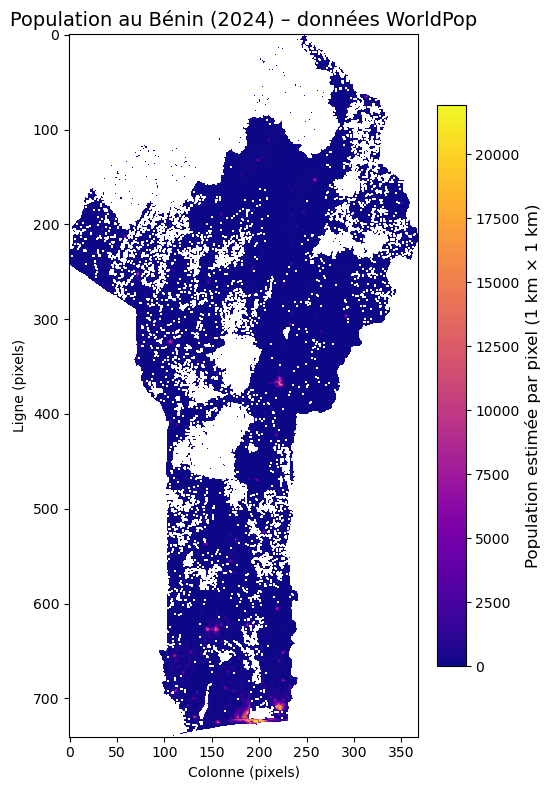

In [20]:
with rasterio.open(POP_1KM_PATH) as src:
    # Lire la première bande
    data = src.read(1)
    data = np.ma.masked_where(data <= 0, data)
    
    # Affichage avec colorbar fonctionnelle
    fig, ax = plt.subplots(figsize=(10, 8))
    im = ax.imshow(data, cmap='plasma', origin='upper')
    
    # Barre de couleurs
    cbar = plt.colorbar(im, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label("Population estimée par pixel (1 km × 1 km)", fontsize=12)
    
    ax.set_title("Population au Bénin (2024) – données WorldPop", fontsize=14)
    ax.set_xlabel("Colonne (pixels)")
    ax.set_ylabel("Ligne (pixels)")
    plt.tight_layout()
    plt.show()

# <span style="font-weight:600; color:#1a5fb4;">ÉTAPE 1. POPULATION PAR DÉPARTEMENT</span>

In [127]:

def zonal_population(gdf, raster_path, value_name="population"):
    """
    Calcule la somme des valeurs du raster pour chaque polygone.
    Les géométries sont automatiquement reprojetées dans le CRS du raster.
    """
    results = []

    with rasterio.open(raster_path) as src:
        raster_crs = src.crs
        gdf_raster_crs = gdf.to_crs(raster_crs)   # <<< correction centrale

        for geom in gdf_raster_crs.geometry:
            try:
                out_image, out_transform = rasterio.mask.mask(
                    src, [geom], crop=True, filled=True
                )
                data = out_image[0]
                data = np.where(data < 0, 0, data)
                results.append(np.nansum(data))

            except ValueError:
                # Le polygone ne touche pas le raster
                results.append(0)

    return pd.Series(results, index=gdf.index, name=value_name)

dep_stats = departement.copy()  # en WGS84 (identique au raster)
dep_stats["pop_totale"] = zonal_population(departement, POP_1KM_PATH)


In [128]:
# Reprojection en UTM pour les surfaces
dep_stats_utm = dep_stats.to_crs(CRS_UTM)

# Surface en km²
dep_stats["area_km2"] = dep_stats_utm.geometry.area / 1e6

# Densité démographique
dep_stats["densite_pop"] = dep_stats["pop_totale"] / dep_stats["area_km2"]


In [220]:
DEPT_COL = "shapeName"
dep_stats[[DEPT_COL, "pop_totale", "area_km2", "densite_pop"]]

,departement,pop_totale,area_km2,densite_pop
0,Borgou,1.888630e+06,24997.189142,75.553700
1,Alibori,1.210757e+06,26496.868269,45.694353
2,Atakora,1.023199e+06,21190.929432,48.284748
3,Donga,7.231430e+05,11196.023366,64.589272
4,Collines,8.131518e+05,14225.626871,57.161053
5,Plateau,6.358816e+05,3137.820679,202.650722
6,Zou,1.171995e+06,5043.655211,232.370141
7,Littoral,1.235458e+06,188.482672,6554.755060
8,Kouffo,5.844704e+05,2349.949757,248.716115
9,Oueme,1.712313e+06,1367.584186,1252.071092


In [131]:
print("Population total du bénin :", dep_stats['pop_totale'].sum(), "hbts")

Population total du bénin : 14175974.0 hbts


# <span style="font-weight:600; color:#1a5fb4;">ÉTAPE 3. Population desservie par les infrastructures</span>

In [34]:
def make_buffer(points_gdf, radius_m, dissolve=True):
    """
    Crée un buffer autour des points et produit un GeoDataFrame
    avec un CRS défini (CRS_UTM), prêt à être re-projeté.
    """
    # reprojection en UTM pour distances
    gdf_utm = points_gdf.to_crs(CRS_UTM)

    buffers = gdf_utm.buffer(radius_m)

    if dissolve:
        return gpd.GeoDataFrame(
            geometry=[buffers.unary_union],
            crs=CRS_UTM                # <<< correction essentielle
        )
    else:
        return gpd.GeoDataFrame(
            geometry=buffers,
            crs=CRS_UTM                # <<< idem
        )


In [35]:

def zonal_population(gdf, raster_path, value_name="population"):
    """
    Calcule la somme des valeurs du raster pour chaque polygone.
    Les géométries sont automatiquement reprojetées dans le CRS du raster.
    """
    results = []

    with rasterio.open(raster_path) as src:
        raster_crs = src.crs
        gdf_raster_crs = gdf.to_crs(raster_crs)   # <<< correction centrale

        for geom in gdf_raster_crs.geometry:
            try:
                out_image, out_transform = rasterio.mask.mask(
                    src, [geom], crop=True, filled=True
                )
                data = out_image[0]
                data = np.where(data < 0, 0, data)
                results.append(np.nansum(data))

            except ValueError:
                # Le polygone ne touche pas le raster
                results.append(0)

    return pd.Series(results, index=gdf.index, name=value_name)


## <span style="font-weight: 600; color: #2d5e8a;">1. Hopitaux </span>

In [39]:
def local_population_density(points_gdf, radius_m, raster_path):
    """
    Pour chaque point :
      - crée un buffer de rayon `radius_m` (en mètres)
      - calcule la population à l'intérieur (WorldPop)
      - calcule la densité = population / surface (hab/km²)

    Retourne un DataFrame aligné sur l'index de points_gdf,
    avec colonnes 'pop_local' et 'dens_local'.
    """
    # Travail en UTM pour les distances/surfaces
    pts_utm = points_gdf.to_crs(CRS_UTM).copy()
    buffers = pts_utm.buffer(radius_m)

    buffers_gdf = gpd.GeoDataFrame(geometry=buffers, crs=CRS_UTM)

    # Surface de chaque buffer en km²
    area_km2 = buffers_gdf.geometry.area / 1e6

    # Reprojection en WGS84 pour zonal_population (CRS du raster)
    buffers_wgs = buffers_gdf.to_crs(CRS_WGS84)

    pops = []
    for geom in buffers_wgs.geometry:
        tmp = gpd.GeoDataFrame(geometry=[geom], crs=CRS_WGS84)
        pop_val = zonal_population(tmp, raster_path).values[0]
        pops.append(pop_val)

    pops = np.array(pops, dtype=float)
    dens = pops / area_km2.replace(0, np.nan)

    return pd.DataFrame(
        {
            "pop_local": pops,
            "dens_local": dens,
        },
        index=points_gdf.index,
    )


In [40]:
# Densité locale autour des hôpitaux (rayon 2 km)
hospitals_wgs = hospitals.to_crs(CRS_WGS84).copy()

hosp_local = local_population_density(
    hospitals_wgs,
    radius_m=2_000,          # rayon "local" pour définir urbain/rural
    raster_path=POP_100m_PATH
)

hospitals_zoned = hospitals_wgs.copy()
hospitals_zoned[["pop_local_2km", "dens_local_2km"]] = hosp_local


In [41]:
print(hospitals_zoned["dens_local_2km"].describe())


count      119.000000
mean      3074.954774
std       3929.654568
min         28.655276
25%        332.305631
50%       1160.137536
75%       4943.890394
max      18701.840780
Name: dens_local_2km, dtype: float64


In [43]:
# Seuil : médiane de la densité locale
dens_threshold = hospitals_zoned["dens_local_2km"].median()
print("Seuil de densité pour urbain :", dens_threshold)

hospitals_zoned["zone"] = np.where(
    hospitals_zoned["dens_local_2km"] >= dens_threshold,
    "urbain",
    "rural"
)

print(hospitals_zoned["zone"].value_counts())


Seuil de densité pour urbain : 1160.1375357934942
zone
urbain    60
rural     59
Name: count, dtype: int64


In [44]:
RADIUS_BY_ZONE = {
    "hospitals":  {"urbain": 5000,  "rural": 15000},
    "pharmacies": {"urbain": 2000,  "rural": 7000},
}


In [180]:
hosp = hospitals_zoned.to_crs(CRS_UTM).copy()
hosp["buffer_radius_m"] = hosp["zone"].map(RADIUS_BY_ZONE["hospitals"])

buffers_hosp = hosp.copy()
buffers_hosp["geometry"] = hosp.apply(
    lambda row: row.geometry.buffer(row["buffer_radius_m"]),
    axis=1
)

buffers_hosp_wgs84 = buffers_hosp.to_crs(CRS_WGS84)

# Population desservie par hôpital (rayon dépendant de la zone)
pop_list = []
for geom in buffers_hosp_wgs84.geometry:
    tmp = gpd.GeoDataFrame(geometry=[geom], crs=CRS_WGS84)
    pop_val = zonal_population(tmp, POP_100m_PATH).values[0]
    pop_list.append(pop_val)

buffers_hosp_wgs84["population"] = pop_list

# Nom + subset final
if "name" in hospitals.columns:
    buffers_hosp_wgs84["name"] = hospitals["name"].fillna("Hôpital non nommé").values
else:
    buffers_hosp_wgs84["name"] = "Hôpital"

final_gdf = buffers_hosp_wgs84[["name", "zone", "buffer_radius_m", "population", "geometry"]].copy()

center_y = final_gdf.geometry.centroid.y.mean()
center_x = final_gdf.geometry.centroid.x.mean()
m = folium.Map(location=[center_y, center_x], zoom_start=7, tiles="CartoDB positron")

def style_function(feature):
    zone = feature["properties"]["zone"]
    color = "#4fc3f7" if zone == "urbain" else "#e57373"
    return {
        "fillColor": color,
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.25,
    }

folium.GeoJson(
    final_gdf.__geo_interface__,
    style_function=style_function,
    tooltip=GeoJsonTooltip(
        fields=["name", "zone", "buffer_radius_m", "population"],
        aliases=["Nom :", "Zone :", "Rayon (m) :", "Population desservie :"],
        localize=True,
        style=(
            "background-color: white; border: 1px solid #333; "
            "border-radius: 4px; padding: 5px; font-family: Arial, sans-serif;"
        ),
    )
).add_to(m)

# Points des hôpitaux
hospitals_wgs84 = hospitals_zoned.to_crs(CRS_WGS84)
for _, row in hospitals_wgs84.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,
        color="#212121",
        fill=True,
        fillColor="#212121",
        fillOpacity=0.9,
    ).add_to(m)

output_path = OUTPUT_DIR / "hospitals_buffers_map.html"
m.save(str(output_path))

m


C:\Users\HP\AppData\Local\Temp\ipykernel_4324\3819202509.py:29: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_y = final_gdf.geometry.centroid.y.mean()
C:\Users\HP\AppData\Local\Temp\ipykernel_4324\3819202509.py:30: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_x = final_gdf.geometry.centroid.x.mean()


## <span style="font-weight: 600; color: #2d5e8a;">2. Pharmacies</span>

In [47]:
# Densité locale autour des hôpitaux (rayon 2 km)
pharmacies_wgs = pharmacies.to_crs(CRS_WGS84).copy()

pharm_local = local_population_density(
    pharmacies_wgs,
    radius_m=2_000,          # rayon "local" pour définir urbain/rural
    raster_path=POP_100m_PATH
)

pharmacies_zoned = pharmacies_wgs.copy()
pharmacies_zoned[["pop_local_2km", "dens_local_2km"]] = pharm_local


In [48]:
print(pharmacies_zoned["dens_local_2km"].describe())

count      257.000000
mean     10144.238091
std       5863.056360
min        143.610058
25%       5274.068964
50%      11012.296372
75%      14335.414482
max      21878.502622
Name: dens_local_2km, dtype: float64


In [49]:
# Seuil : médiane de la densité locale
dens_threshold = pharmacies_zoned["dens_local_2km"].median()
print("Seuil de densité pour urbain :", dens_threshold)

pharmacies_zoned["zone"] = np.where(
    pharmacies_zoned["dens_local_2km"] >= dens_threshold,
    "urbain",
    "rural"
)

print(pharmacies_zoned["zone"].value_counts())


Seuil de densité pour urbain : 11012.296371827539
zone
urbain    129
rural     128
Name: count, dtype: int64


In [181]:

pharm = pharmacies_zoned.to_crs(CRS_UTM).copy()

# Rayon selon urbain/rural
pharm["buffer_radius_m"] = pharm["zone"].map(RADIUS_BY_ZONE["pharmacies"])

# Création du buffer
buffers_pharm = pharm.copy()
buffers_pharm["geometry"] = pharm.apply(
    lambda row: row.geometry.buffer(row["buffer_radius_m"]),
    axis=1
)

# Reprojection en WGS84
buffers_pharm_wgs84 = buffers_pharm.to_crs(CRS_WGS84)


pop_list = []
for geom in buffers_pharm_wgs84.geometry:
    tmp = gpd.GeoDataFrame(geometry=[geom], crs=CRS_WGS84)
    pop_val = zonal_population(tmp, POP_100m_PATH).values[0]
    pop_list.append(pop_val)

buffers_pharm_wgs84["population"] = pop_list

# Nom (si colonne absente)
if "name" in pharmacies.columns:
    buffers_pharm_wgs84["name"] = pharmacies["name"].fillna("Pharmacie non nommée").values
else:
    buffers_pharm_wgs84["name"] = "Pharmacie"

# Subset final
final_gdf_pharm = buffers_pharm_wgs84[
    ["name", "zone", "buffer_radius_m", "population", "geometry"]
].copy()


center_y = final_gdf_pharm.geometry.centroid.y.mean()
center_x = final_gdf_pharm.geometry.centroid.x.mean()

m2 = folium.Map(location=[center_y, center_x], zoom_start=7, tiles="CartoDB positron")

def style_function(feature):
    zone = feature["properties"]["zone"]
    color = "#4fc3f7" if zone == "urbain" else "#e57373"   # bleu / rouge
    return {
        "fillColor": color,
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.25,
    }

folium.GeoJson(
    final_gdf_pharm.__geo_interface__,
    style_function=style_function,
    tooltip=GeoJsonTooltip(
        fields=["name", "zone", "buffer_radius_m", "population"],
        aliases=[
            "Nom :", "Zone :", "Rayon (m) :", "Population desservie :"
        ],
        localize=True,
        style=(
            "background-color: white; border: 1px solid #333; "
            "border-radius: 4px; padding: 5px; font-family: Arial, sans-serif;"
        ),
    )
).add_to(m2)

# Points des pharmacies
pharmacies_wgs84 = pharmacies_zoned.to_crs(CRS_WGS84)
for _, row in pharmacies_wgs84.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=4,
        color="#212121",
        fill=True,
        fillColor="#212121",
        fillOpacity=0.9,
    ).add_to(m2)

output_path = OUTPUT_DIR / "pharmacies_buffers_map.html"
m2.save(str(output_path))

m2


C:\Users\HP\AppData\Local\Temp\ipykernel_4324\2959829274.py:37: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_y = final_gdf_pharm.geometry.centroid.y.mean()
C:\Users\HP\AppData\Local\Temp\ipykernel_4324\2959829274.py:38: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_x = final_gdf_pharm.geometry.centroid.x.mean()


In [63]:
departement_wgs84 = departement.to_crs(CRS_WGS84).copy()
departement_wgs84

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Borgou,BJ-BO,11314189B6086502013331,BEN,ADM1,"POLYGON ((3.83846 10.69136, 3.80596 10.68493, ..."
1,Alibori,BJ-AL,11314189B84365908568321,BEN,ADM1,"POLYGON ((3.83846 10.69136, 3.836 10.73769, 3...."
2,Atakora,BJ-AK,11314189B98234112011604,BEN,ADM1,"POLYGON ((2.29147 10.51472, 2.28431 10.73458, ..."
3,Donga,BJ-DO,11314189B13023113934095,BEN,ADM1,"POLYGON ((2.11848 10.06342, 2.09003 10.06395, ..."
4,Collines,BJ-CO,11314189B64147716128567,BEN,ADM1,"POLYGON ((2.1896 8.75772, 2.18239 8.75218, 2.1..."
5,Plateau,BJ-PL,11314189B63929627317717,BEN,ADM1,"POLYGON ((2.40188 7.44907, 2.40499 7.42115, 2...."
6,Zou,BJ-ZO,11314189B15837635829289,BEN,ADM1,"POLYGON ((1.63336 7.65103, 1.64092 7.52588, 1...."
7,Littoral,BJ-LI,11314189B51785125282818,BEN,ADM1,"POLYGON ((2.33088 6.30239, 2.34964 6.30487, 2...."
8,Kouffo,None,11314189B98727282609866,BEN,ADM1,"POLYGON ((1.64327 7.52441, 1.64334 7.49576, 1...."
9,Oueme,BJ-OU,11314189B51984097201256,BEN,ADM1,"MULTIPOLYGON (((2.54792 6.33911, 2.54672 6.338..."


In [67]:
hosp_dep = gpd.sjoin(
    buffers_hosp_wgs84, 
    departement_wgs84[["shapeName", "geometry"]],
    how="left",
    predicate="intersects"
)

hosp_dep.rename(columns={"shapeName": "departement"}, inplace=True)


In [68]:
pharm_dep = gpd.sjoin(
    buffers_pharm_wgs84, 
    departement_wgs84[["shapeName", "geometry"]],
    how="left",
    predicate="intersects"
)

pharm_dep.rename(columns={"shapeName": "departement"}, inplace=True)


In [69]:
hosp_stats_dep = (
    hosp_dep
    .groupby(["departement", "zone"])["population"]
    .mean()
    .reset_index()
    .pivot(index="departement", columns="zone", values="population")
    .rename(columns={"urbain": "hosp_pop_moy_urbain",
                     "rural": "hosp_pop_moy_rural"})
)


In [218]:
pharm_stats_dep

zone,pharm_pop_moy_rural,pharm_pop_moy_urbain
departement,,
Alibori,74202.734375,NaN
Atakora,81995.867188,NaN
Atlanique,494220.750000,166608.328125
Borgou,443793.781250,150664.421875
Collines,58106.019531,NaN
Donga,111380.718750,NaN
Kouffo,104534.882812,NaN
Littoral,741892.125000,196518.812500
Mono,79190.070312,NaN


## <span style="font-weight: 600; color: #2d5e8a;">3. Résultats</span>

In [80]:
dep_stats_inf = (
    hosp_stats_dep
    .join(pharm_stats_dep, how="outer")
    .reset_index()
)

dep_stats_inf


zone,departement,hosp_pop_moy_rural,hosp_pop_moy_urbain,pharm_pop_moy_rural,pharm_pop_moy_urbain
0,Alibori,9.489291e+04,87377.359375,74202.734375,NaN
1,Atakora,7.337820e+04,64795.425781,81995.867188,NaN
2,Atlanique,3.269143e+05,442785.187500,494220.750000,166608.328125
3,Borgou,1.454460e+05,251137.171875,443793.781250,150664.421875
4,Collines,3.773197e+04,58789.433594,58106.019531,NaN
5,Donga,1.212770e+04,83240.648438,111380.718750,NaN
6,Kouffo,2.589183e+05,84148.593750,104534.882812,NaN
7,Littoral,1.885610e+06,760794.687500,741892.125000,196518.812500
8,Mono,2.718441e+05,94650.117188,79190.070312,NaN
9,Oueme,7.408549e+05,398982.593750,491024.125000,201036.625000


In [ ]:

dep_stats.rename(columns={
    "shapeName": "departement"
}, inplace=True)

dep_stats = (
    dep_stats
    .merge(dep_stats_inf, on='departement', how="left")
)


In [221]:
import os
csv_path = os.path.join(OUTPUT_DIR, "dept_stats.csv")
dep_stats[[DEPT_COL, "pop_totale", "area_km2", "densite_pop", "hosp_pop_moy_rural", "hosp_pop_moy_urbain", "pharm_pop_moy_rural",	"pharm_pop_moy_urbain"]].to_csv(csv_path, index=False, encoding='utf-8')

# <span style="font-weight:600; color:#1a5fb4;">ÉTAPE 4. Population vivant dans les aires protégées</span>

In [133]:
protected_areas.columns

Index(['WDPAID', 'WDPA_PID', 'PA_DEF', 'NAME', 'ORIG_NAME', 'DESIG',
       'DESIG_ENG', 'DESIG_TYPE', 'IUCN_CAT', 'INT_CRIT', 'MARINE',
       'REP_M_AREA', 'GIS_M_AREA', 'REP_AREA', 'GIS_AREA', 'NO_TAKE',
       'NO_TK_AREA', 'STATUS', 'STATUS_YR', 'GOV_TYPE', 'OWN_TYPE',
       'MANG_AUTH', 'MANG_PLAN', 'VERIF', 'METADATAID', 'SUB_LOC',
       'PARENT_ISO', 'ISO3', 'SUPP_INFO', 'CONS_OBJ', 'geometry',
       'pop_protected', 'pop__viv_protected'],
      dtype='object')

In [134]:

protected_areas = protected_areas.to_crs(CRS_WGS84)  # pour être sûr

protected_areas["pop__viv_protected"] = zonal_population(
    protected_areas,
    POP_100m_PATH,
    value_name="pop__viv_protected"
)

protected_areas[["pop__viv_protected"]].head()


,pop__viv_protected
0,2035.334473
1,7857.614258
2,65403.292969
3,4572.587402
4,1945.490479


In [135]:
pop_tot_protected = protected_areas["pop__viv_protected"].sum()
print(f"Population totale dans les zones protégées : {pop_tot_protected:.0f} hab.")

Population totale dans les zones protégées : 312379 hab.


In [136]:

departement_wgs84 = departement.to_crs(CRS_WGS84)

protected_dept = gpd.sjoin(
    protected_areas,
    departement_wgs84[[DEPT_COL, "geometry"]],
    how="left",
    predicate="intersects"
)


protected_dept[[DEPT_COL, "pop__viv_protected"]].head()


,shapeName,pop__viv_protected
0,Atakora,2035.334473
1,Alibori,7857.614258
2,Atakora,65403.292969
3,Atakora,4572.587402
3,Alibori,4572.587402


In [137]:
protected_dept.rename(columns={
    "shapeName": "departement"
}, inplace=True)

In [138]:
protected_dept = (
    protected_dept
    .merge(dep_stats, on='departement', how="left")
)



# Remplacer les NA par 0 (départements sans zones protégées)
protected_dept["pop_protected"] = protected_dept["pop_protected"].fillna(0)

# Pourcentage de la population du département vivant dans une zone protégée
protected_dept["pct_pop_protected"] = 100 * protected_dept["pop_protected"] / protected_dept["pop_totale"]




In [225]:
protected_dept.columns

Index(['WDPAID', 'WDPA_PID', 'PA_DEF', 'NAME', 'ORIG_NAME', 'DESIG',
       'DESIG_ENG', 'DESIG_TYPE', 'IUCN_CAT', 'INT_CRIT', 'MARINE',
       'REP_M_AREA', 'GIS_M_AREA', 'REP_AREA', 'GIS_AREA', 'NO_TAKE',
       'NO_TK_AREA', 'STATUS', 'STATUS_YR', 'GOV_TYPE', 'OWN_TYPE',
       'MANG_AUTH', 'MANG_PLAN', 'VERIF', 'METADATAID', 'SUB_LOC',
       'PARENT_ISO', 'ISO3', 'SUPP_INFO', 'CONS_OBJ', 'geometry_x',
       'pop_protected', 'pop__viv_protected', 'index_right', 'departement',
       'shapeISO', 'shapeID', 'shapeGroup', 'shapeType', 'pop_totale',
       'area_km2', 'densite_pop', 'hosp_pop_moy_rural', 'hosp_pop_moy_urbain',
       'pharm_pop_moy_rural', 'pharm_pop_moy_urbain', 'pct_pop_protected'],
      dtype='object')

In [228]:
import os
csv_path = os.path.join(OUTPUT_DIR, "pop_vivant_dans_les_aires_reservees_par_dept.csv")
protected_dept[[DEPT_COL, "NAME", "DESIG", "departement", "pop_protected", "pct_pop_protected"]].to_csv(csv_path, index=False, encoding='utf-8')

In [205]:
# On suppose que 'geometry_x' = géométrie des départements
protected_dept = gpd.GeoDataFrame(
    protected_dept,
    geometry="geometry_x",       # colonne à utiliser comme géométrie
    crs=departement.crs         # on reprend le CRS des départements
)

# Optionnel : on supprime l'autre géométrie si elle ne sert plus
if "geometry_y" in protected_dept.columns:
    protected_dept = protected_dept.drop(columns=["geometry_y"])


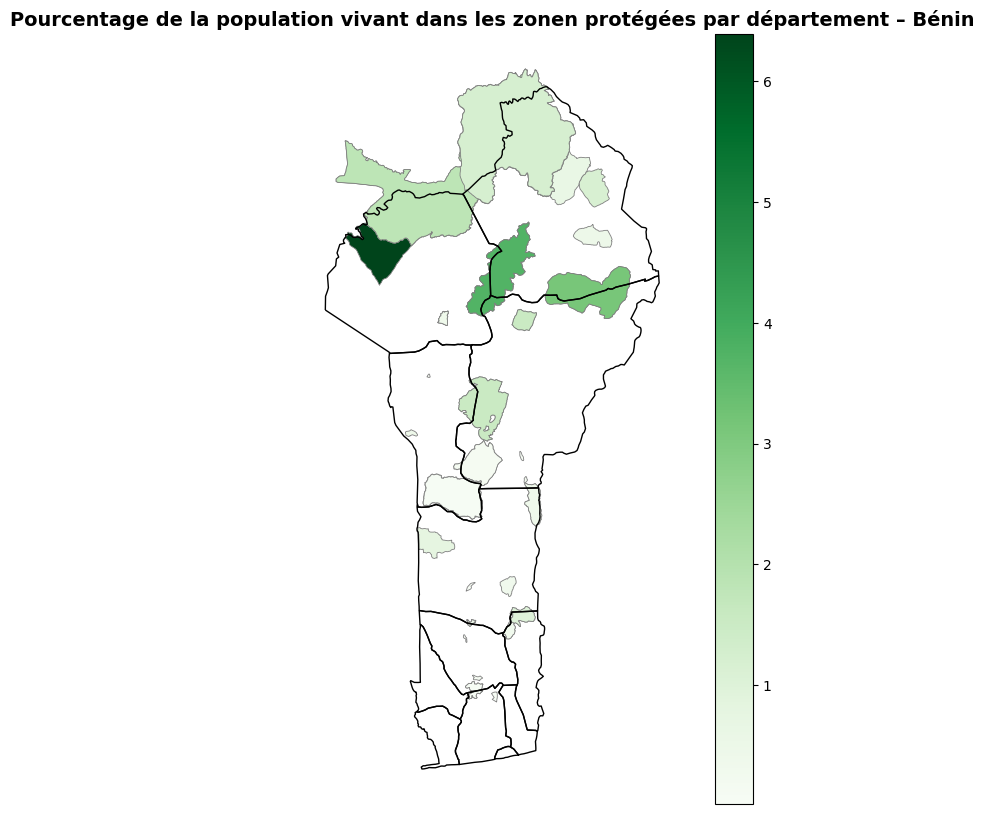

In [209]:
fig, ax = plt.subplots(figsize=(10, 10))

# --- Carte choroplèthe ---
protected_dept.plot(
    column="pct_pop_protected",
    cmap="Greens",
    legend=True,
    edgecolor="grey",     # bordure légère pour chaque polygone
    linewidth=0.6,
    ax=ax
)

# --- Limites départementales en surimpression ---
departement.to_crs(protected_dept.crs).boundary.plot(
    ax=ax,
    color="black",
    linewidth=1.0,
    label="Limites départementales"
)

ax.set_title(
    "Pourcentage de la population vivant dans les zonen protégées par département – Bénin",
    fontsize=14,
    fontweight="bold"
)

ax.set_axis_off()
plt.savefig(OUTPUT_DIR / "pop_aires_reservees_benin.png", dpi=300, bbox_inches='tight')
plt.show()


# <span style="font-weight:600; color:#1a5fb4;">ÉTAPE 4. Population dans les corridors de transport</span>

In [182]:
# Paramètres et filtrage

In [193]:
ROAD_BUFFER_M = 2000
RAIL_BUFFER_M = 2000

MAIN_HIGHWAYS = ["trunk", "primary", 'secondary']  # routes "importantes"
RAILWAY_VALID = ["rail"]              # d'après ton print


In [194]:
# Construire le corridor transport (routes + rails)

In [195]:
def build_transport_corridor(roads_gdf, railways_gdf,
                             road_classes=MAIN_HIGHWAYS,
                             rail_classes=RAILWAY_VALID,
                             road_buffer_m=ROAD_BUFFER_M,
                             rail_buffer_m=RAIL_BUFFER_M):
    # --- Routes principales ---
    roads_main = roads_gdf[roads_gdf["fclass"].isin(road_classes)].copy()

    # --- Rails ---
    rails_main = railways_gdf[railways_gdf["railway"].isin(rail_classes)].copy()

    geoms = []

    if not roads_main.empty:
        roads_utm = roads_main.to_crs(CRS_UTM)
        geoms.append(roads_utm.buffer(road_buffer_m).union_all())

    if not rails_main.empty:
        rails_utm = rails_main.to_crs(CRS_UTM)
        geoms.append(rails_utm.buffer(rail_buffer_m).union_all())

    if not geoms:
        raise ValueError("Aucune route principale ni voie ferrée trouvée.")

    # Union des buffers routes + rails
    corridor_union = geoms[0]
    if len(geoms) > 1:
        corridor_union = corridor_union.union(geoms[1])

    corridor_utm = gpd.GeoDataFrame(geometry=[corridor_union], crs=CRS_UTM)
    corridor_wgs84 = corridor_utm.to_crs(CRS_WGS84)

    return corridor_utm, corridor_wgs84


In [196]:
corridor_utm, corridor_wgs84 = build_transport_corridor(roads, railways)
print("Bounds corridor transport :", corridor_wgs84.total_bounds)


Bounds corridor transport : [ 0.62510898  6.22199288  3.96844091 12.46854607]


In [197]:
# Localités dans le corridor transport

In [198]:
places_wgs84 = places.to_crs(CRS_WGS84).copy()

places_in_corridor = gpd.sjoin(
    places_wgs84,
    corridor_wgs84,
    how="inner",
    predicate="intersects"  # plus logique ici
)

print("Nombre total de localités dans le corridor transport :", len(places_in_corridor))
print(places_in_corridor["fclass"].value_counts())


Nombre total de localités dans le corridor transport : 403
fclass
village    327
hamlet      69
farm         4
town         3
Name: count, dtype: int64


In [199]:
# Population dans le corridor transport

In [210]:
pop_corridor_transport = zonal_population(
    corridor_wgs84,
    POP_100m_PATH
).values[0]

print(f"Population dans le corridor transport : {pop_corridor_transport:,.0f} hbts.")

pct_pop_transport = 100 * pop_corridor_transport / POP_NATIONALE
print(f"Soit {pct_pop_transport:.2f} % de la population nationale.")


Population dans le corridor transport : 10,674,155 hbts.
Soit 75.30 % de la population nationale.


In [202]:
import folium
from folium.features import GeoJsonTooltip

# Reprojection des éléments en WGS84
corridor_wgs84 = corridor_wgs84.to_crs(CRS_WGS84)
roads_wgs84 = roads.to_crs(CRS_WGS84)
railways_wgs84 = railways.to_crs(CRS_WGS84)
places_in_corridor_wgs84 = places_in_corridor.to_crs(CRS_WGS84)


center_y = corridor_wgs84.geometry.centroid.y.mean()
center_x = corridor_wgs84.geometry.centroid.x.mean()

m_corridor = folium.Map(location=[center_y, center_x],
                        zoom_start=7,
                        tiles="CartoDB positron")


def corridor_style(feature):
    return {
        "fillColor": "#ffcc00",
        "color": "#cc9900",
        "weight": 2,
        "fillOpacity": 0.35,
    }


folium.GeoJson(
    corridor_wgs84.__geo_interface__,
    name="Corridor de transport",
    style_function=corridor_style,
    tooltip=GeoJsonTooltip(
        fields=[],
        aliases=[],
        labels=False,
        sticky=True,
    ),
).add_to(m_corridor)



main_roads = roads[
    roads["fclass"].isin(MAIN_HIGHWAYS)
].to_crs(CRS_WGS84)

def road_style(feature):
    return {
        "color": "#0066cc",
        "weight": 2.5,
        "opacity": 0.8,
    }

folium.GeoJson(
    main_roads.__geo_interface__,
    name="Routes principales",
    style_function=road_style
).add_to(m_corridor)


railways_main = railways[
    railways["railway"].isin(RAILWAY_VALID)
].to_crs(CRS_WGS84)

def rail_style(feature):
    return {
        "color": "#cc0000",
        "weight": 2,
        "dashArray": "5, 5",
        "opacity": 0.8,
    }

folium.GeoJson(
    railways_main.__geo_interface__,
    name="Chemins de fer",
    style_function=rail_style
).add_to(m_corridor)


for _, row in places_in_corridor_wgs84.iterrows():
    folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x],
        radius=3,
        color="#333333",
        fill=True,
        fillColor="#333333",
        fillOpacity=1,
        tooltip=f"{row.get('name','Localité')} ({row.get('fclass','-')})"
    ).add_to(m_corridor)


folium.LayerControl().add_to(m_corridor)

output_path = OUTPUT_DIR / "corridor_transp_map.html"
m_corridor.save(str(output_path))

m_corridor


C:\Users\HP\AppData\Local\Temp\ipykernel_4324\2792114351.py:20: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_y = corridor_wgs84.geometry.centroid.y.mean()
C:\Users\HP\AppData\Local\Temp\ipykernel_4324\2792114351.py:21: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_x = corridor_wgs84.geometry.centroid.x.mean()
